In [1]:
using LinearAlgebra
squarednorm(x) = dot(x, x)
using Distributions
using StatsPlots
default(fmt=:png)
using Random
r(x) = round(x; sigdigits=3)

function simplelinreg(x, y)
    n = length(x)
    A = x .^ (0:1)'
    β̂ = A \ y
    df = n - 2
    ŝ = √(squarednorm(y - A*β̂) / df)
    sehat = ŝ*√(inv(A'A)[2,2])
    tval = β̂[2]/sehat
    pval = 2ccdf(TDist(df), abs(tval))
    pvalfunc(β₁) = 2ccdf(TDist(df), abs((β̂[2] - β₁)/sehat))
    posterior = β̂[2] + sehat * TDist(df)
    (; A, β̂, df, sehat, tval, pval, pvalfunc, posterior)
end

simplelinreg (generic function with 1 method)

In [2]:
function plot_dist_betahat1(dist, x)
    @show n = length(x)
    A = x .^ (0:1)'
    @show se = √(inv(A'A)[2,2])
    L = 10^5
    betahat1 = zeros(L)
    pval_beta1 = zeros(L)
    α = 0.05
    c = 0
    dist_reserr = (dist - mean(dist))/std(dist)
    for i in 1:L
        y = rand(dist_reserr, n)
        (; A, β̂, df, sehat, tval, pval, pvalfunc) = simplelinreg(x, y)
        betahat1[i] = β̂[2]
        pval_beta1[i] = pval
        c += pval < α
    end
    @show c/L
    plot(dist_reserr; label="", title="dist. of residual error", size=(400, 250)) |> display
    P = stephist(betahat1; norm=true, label="betahat1")
    plot!(Normal(0, se); label="normal dist.")
    title!("n = $n")
    Q = stephist(pval_beta1; norm=true, label="P-value")
    plot!()
    plot!(ylim=(-0.05, 1.4))
    plot(P, Q; size=(600, 500), layout=@layout[a{0.6h}; b])
end

plot_dist_betahat1 (generic function with 1 method)

n = length(x) = 10
se = √((inv(A' * A))[2, 2]) = 0.11009637651263605
c / L = 0.04977


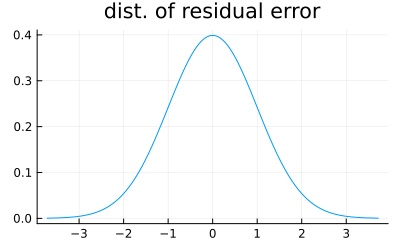

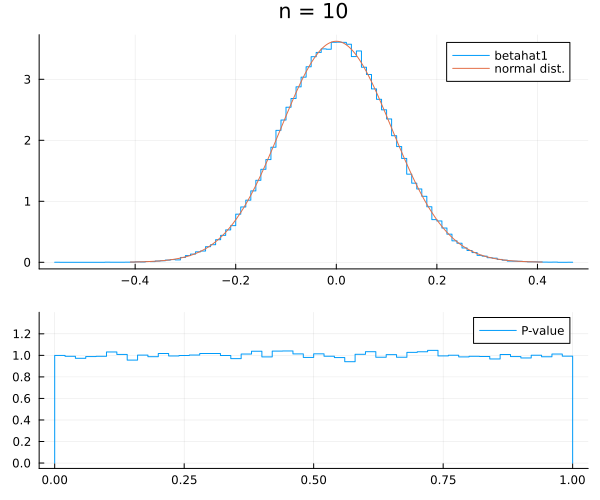

In [3]:
Random.seed!(4649373)
plot_dist_betahat1(Normal(), 1:10)

n = length(x) = 10
se = √((inv(A' * A))[2, 2]) = 0.11009637651263605
c / L = 0.04593


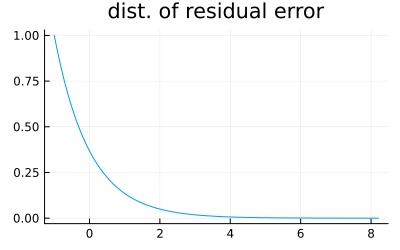

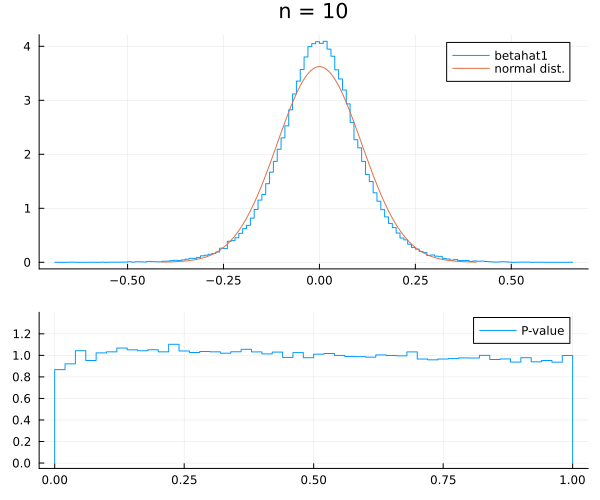

In [4]:
Random.seed!(4649373)
plot_dist_betahat1(Exponential(), 1:10)

n = length(x) = 30
se = √((inv(A' * A))[2, 2]) = 0.021093572976433474
c / L = 0.04641


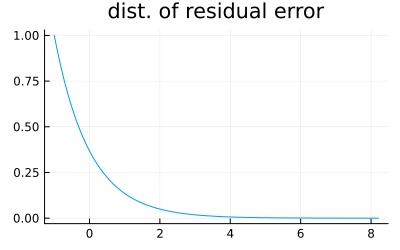

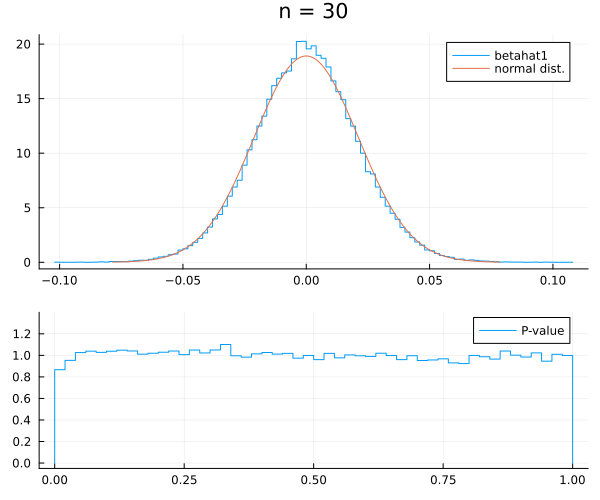

In [5]:
Random.seed!(4649373)
plot_dist_betahat1(Exponential(), 1:30)

n = length(x) = 30
se = √((inv(A' * A))[2, 2]) = 0.021093572976433474
c / L = 0.05059


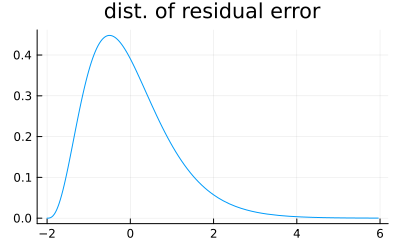

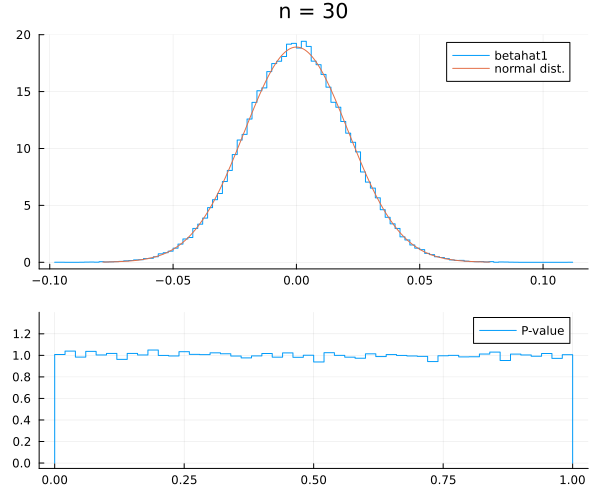

In [6]:
Random.seed!(4649373)
plot_dist_betahat1(Gamma(4, 1/2), 1:30)

In [7]:
function plot_linreg4x4(dist, x)
    n = length(x)
    A = x .^ (0:1)'
    @show se = √(inv(A'A)[2,2])
    L = 10^5
    betahat1 = zeros(L)
    pval_beta1 = zeros(L)
    c = 0
    PP = []
    QQ = []
    np = nq = 0
    α = 0.05
    npmax = nqmax = 16
    dist_reserr = (dist - mean(dist))/std(dist)
    for i in 1:L
        y = rand(dist_reserr, n)
        (; A, β̂, df, sehat, tval, pval, pvalfunc) = simplelinreg(x, y)
        betahat1[i] = β̂[2]
        pval_beta1[i] = pval
        c += pval < α
        P = scatter(x, y; label="", ms=3, msc=:auto)
        plot!(x -> evalpoly(x, β̂), extrema(x)...; label="")
        title!("P = $(r(pval)),  t = $(r(tval)),  β̂₁ = $(r(β̂[2]))")
        plot!(tickfontsize=5, titlefontsize=8)
        if np < npmax && pval < α
            push!(PP, P)
            np += 1
        elseif nq < nqmax && pval ≥ α
            push!(QQ, P)
            nq += 1
        elseif np ≥ npmax && nq ≥ nqmax
            break
        end
    end
    plot(dist_reserr; label="", title="dist. of residual error", size=(400, 250)) |> display
    plot(PP...; size=(1000, 800), layout=(4, 4)) |> display
    plot(QQ...; size=(1000, 800), layout=(4, 4))
end

plot_linreg4x4 (generic function with 1 method)

se = √((inv(A' * A))[2, 2]) = 0.021093572976433474


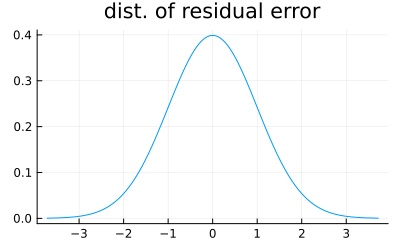

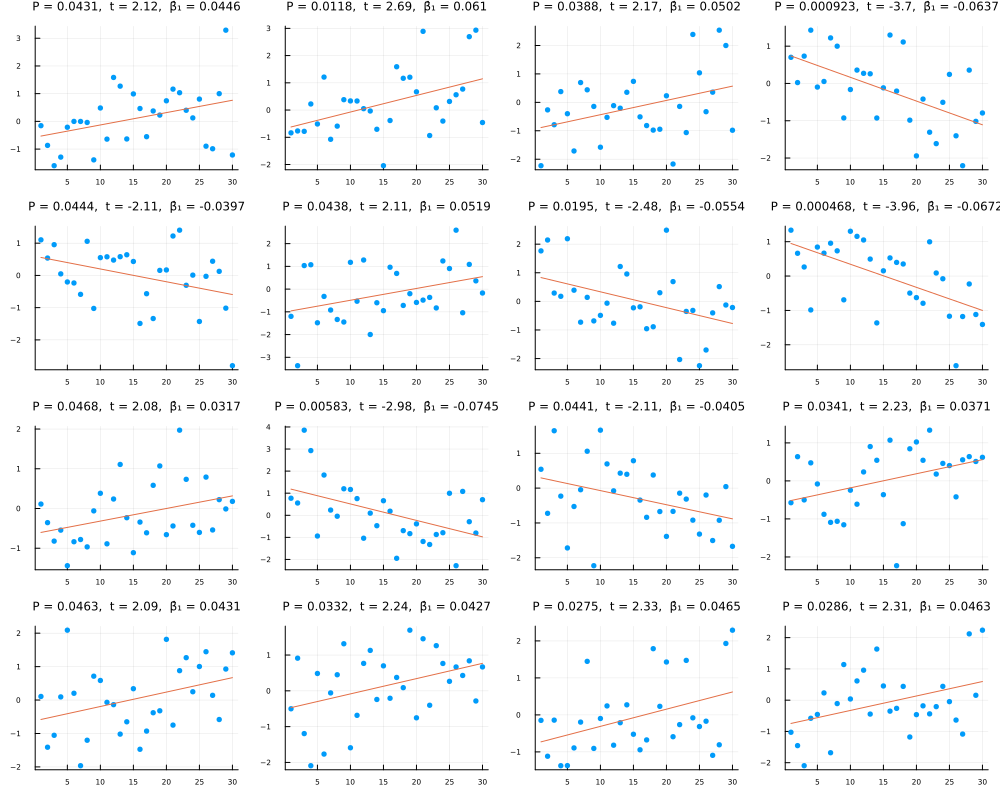

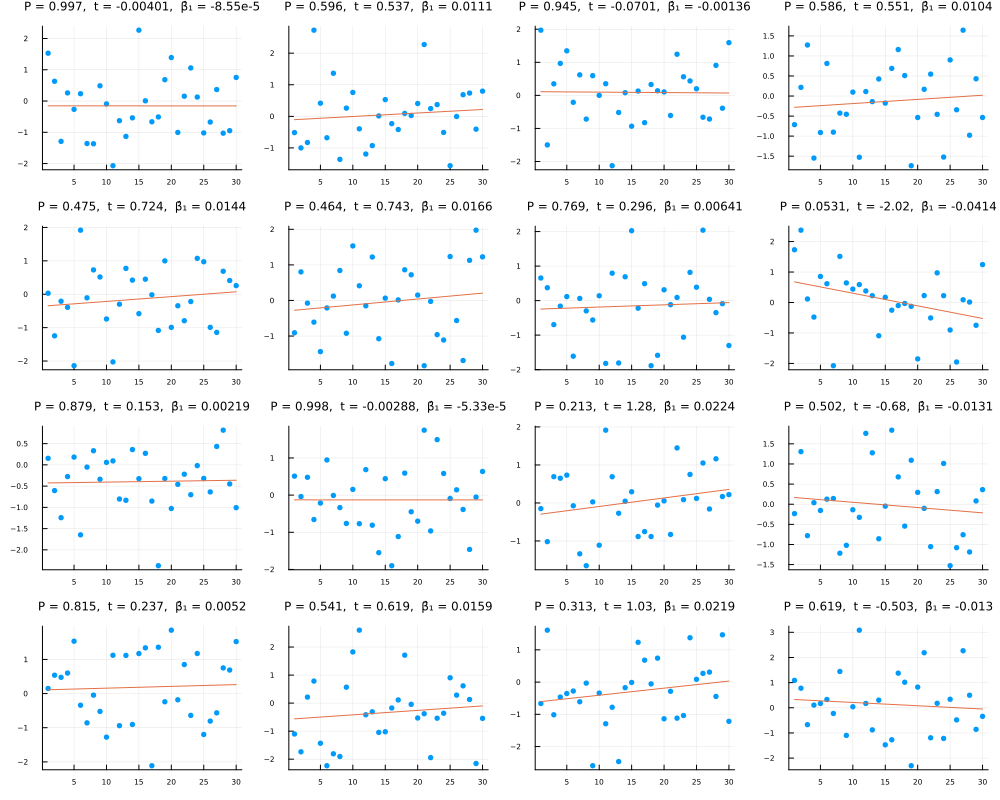

In [8]:
Random.seed!(4649373)
plot_linreg4x4(Normal(), 1:30)

se = √((inv(A' * A))[2, 2]) = 0.021093572976433474


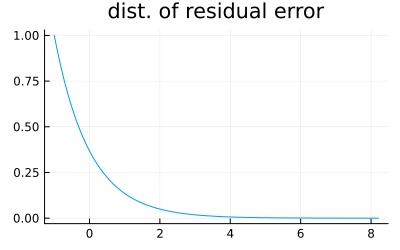

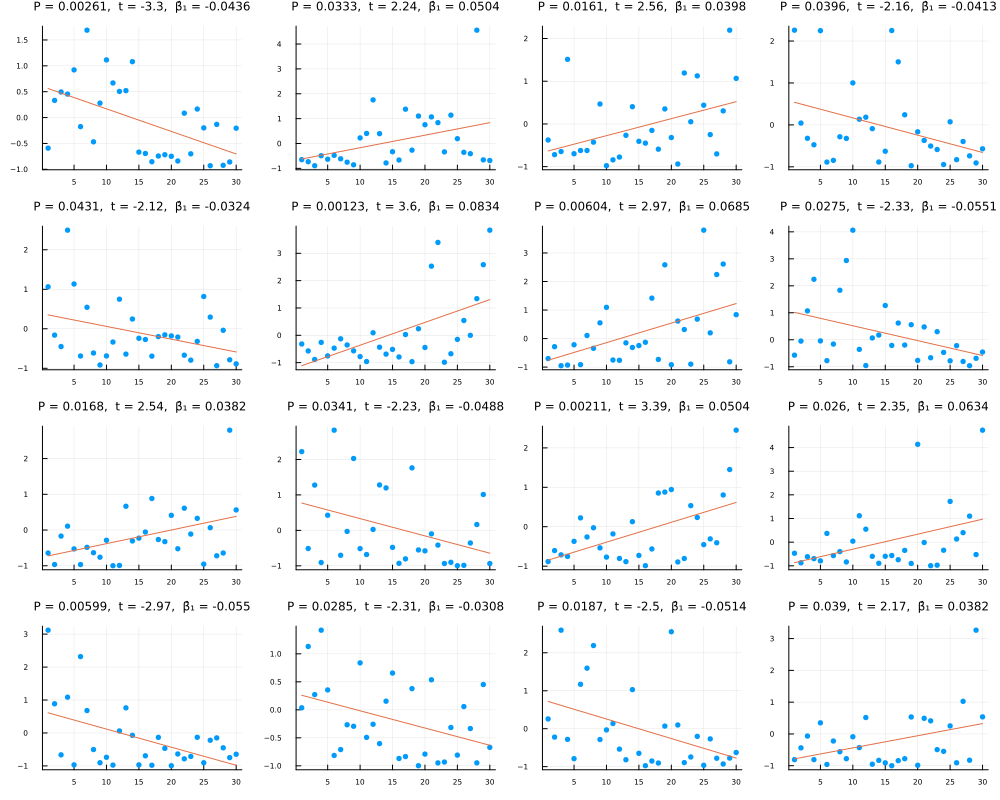

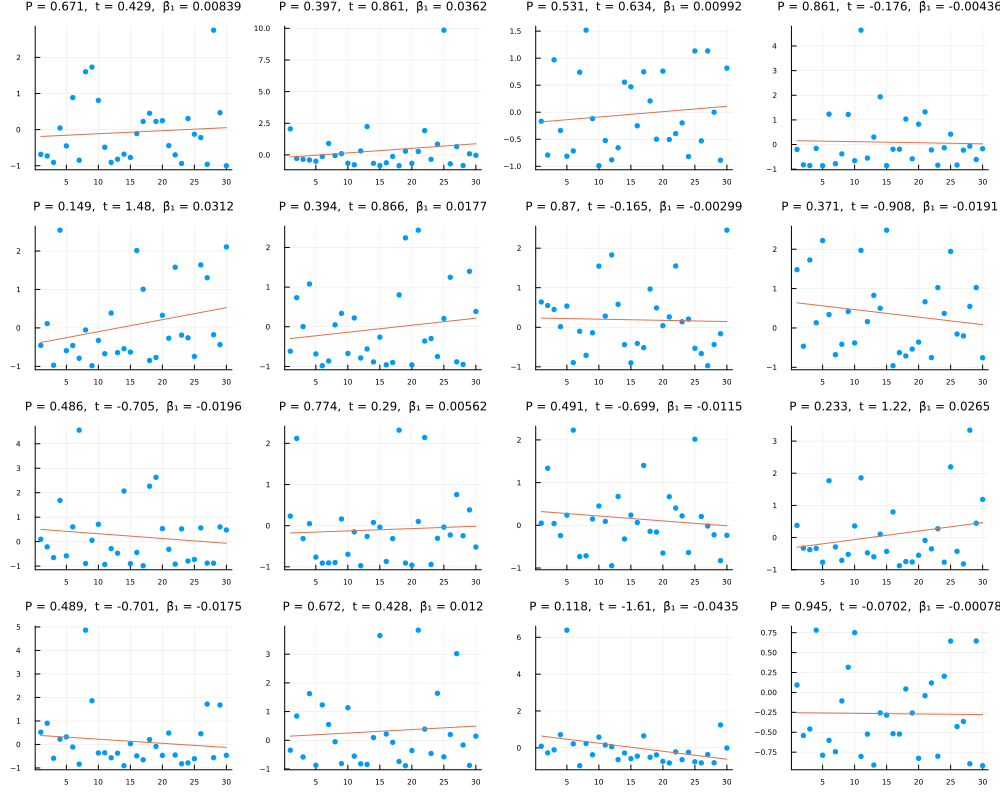

In [9]:
Random.seed!(4649373)
plot_linreg4x4(Exponential(), 1:30)

se = √((inv(A' * A))[2, 2]) = 0.021093572976433474


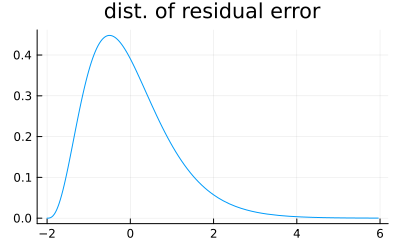

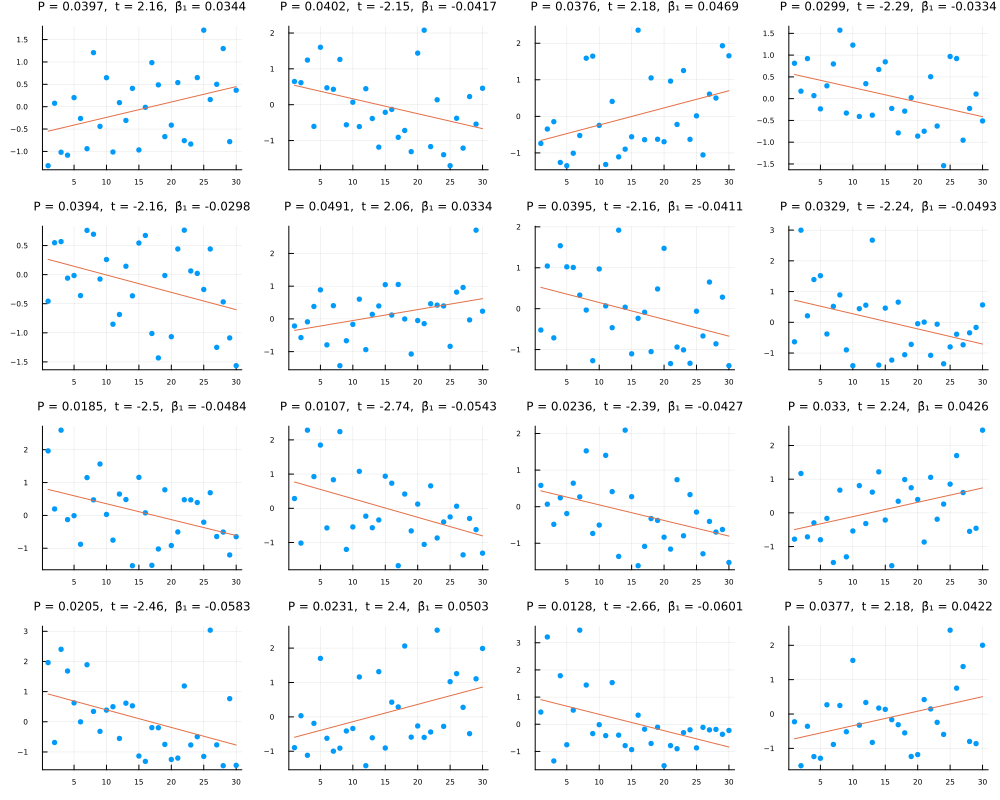

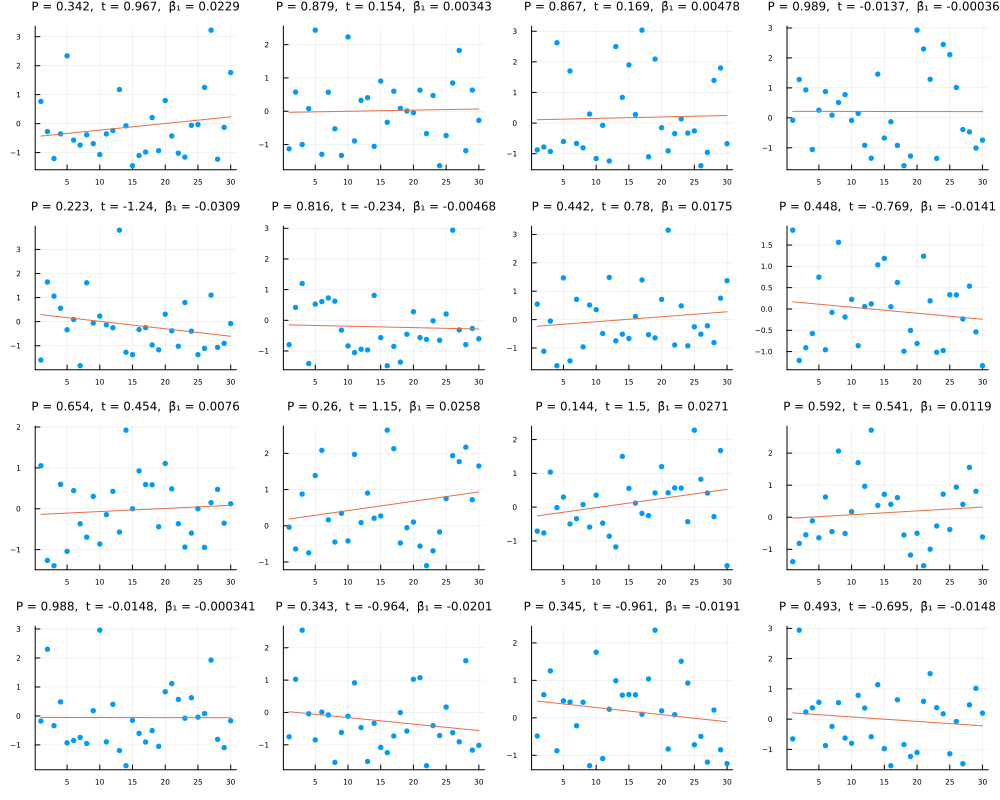

In [10]:
Random.seed!(4649373)
plot_linreg4x4(Gamma(4, 1/2), 1:30)

In [11]:
function plot_pvalfun4x4(dist, x)
    x = 1:30
    n = length(x)
    A = x .^ (0:1)'
    @show se = √(inv(A'A)[2,2])
    L = 10^5
    betahat1 = zeros(L)
    pval_beta1 = zeros(L)
    c = 0
    PP = []
    QQ = []
    np = nq = 0
    α = 0.05
    npmax = nqmax = 16
    dist_reserr = (dist - mean(dist))/std(dist)
    for i in 1:L
        y = rand(dist_reserr, n)
        (; A, β̂, df, sehat, tval, pval, pvalfunc) = simplelinreg(x, y)
        betahat1[i] = β̂[2]
        pval_beta1[i] = pval
        c += pval < α
        P = plot(pvalfunc, β̂[2]-5sehat, β̂[2]+5sehat; label="")
        vline!([0.0]; label="")
        title!("n = $(n),  P = $(r(pval)),  β̂₁ = $(r(β̂[2]))")
        plot!(tickfontsize=5, titlefontsize=8)
        if np < npmax && pval < α
            push!(PP, P)
            np += 1
        elseif nq < nqmax && pval ≥ α
            push!(QQ, P)
            nq += 1
        elseif np ≥ npmax && nq ≥ nqmax
            break
        end
    end
    plot(dist_reserr; label="", title="dist. of residual error", size=(400, 250)) |> display
    plot(PP...; size=(1000, 800), layout=(4, 4)) |> display
    plot(QQ...; size=(1000, 800), layout=(4, 4))
end

plot_pvalfun4x4 (generic function with 1 method)

se = √((inv(A' * A))[2, 2]) = 0.021093572976433474


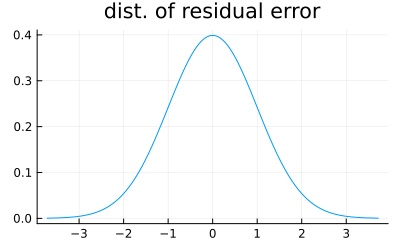

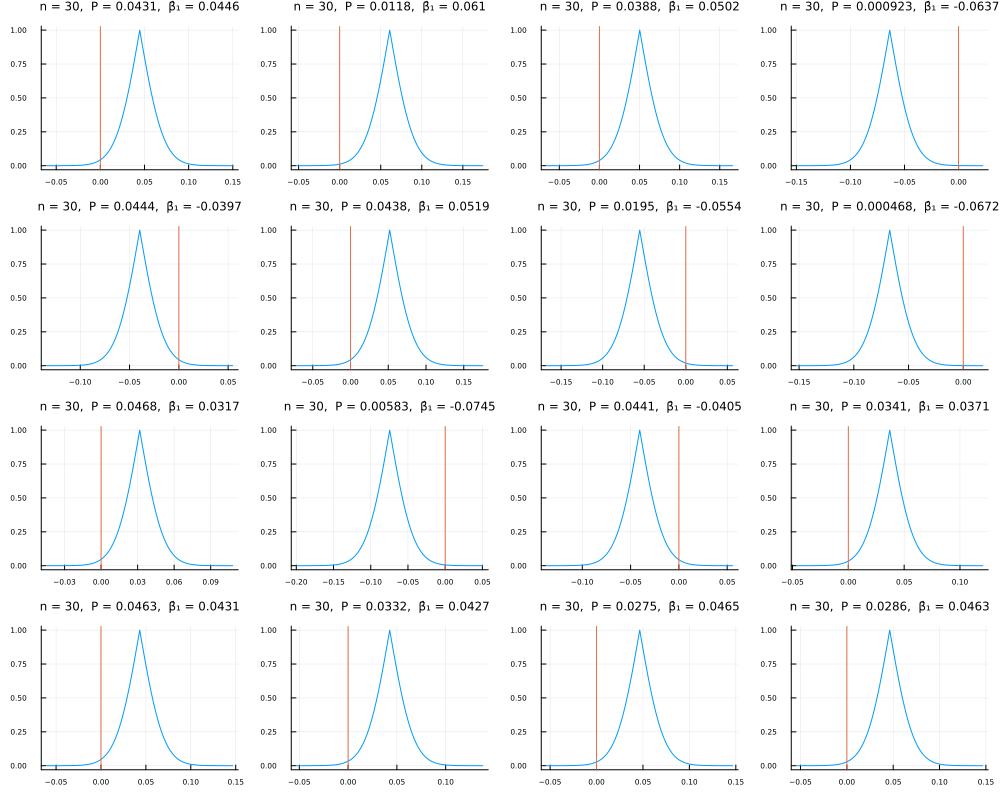

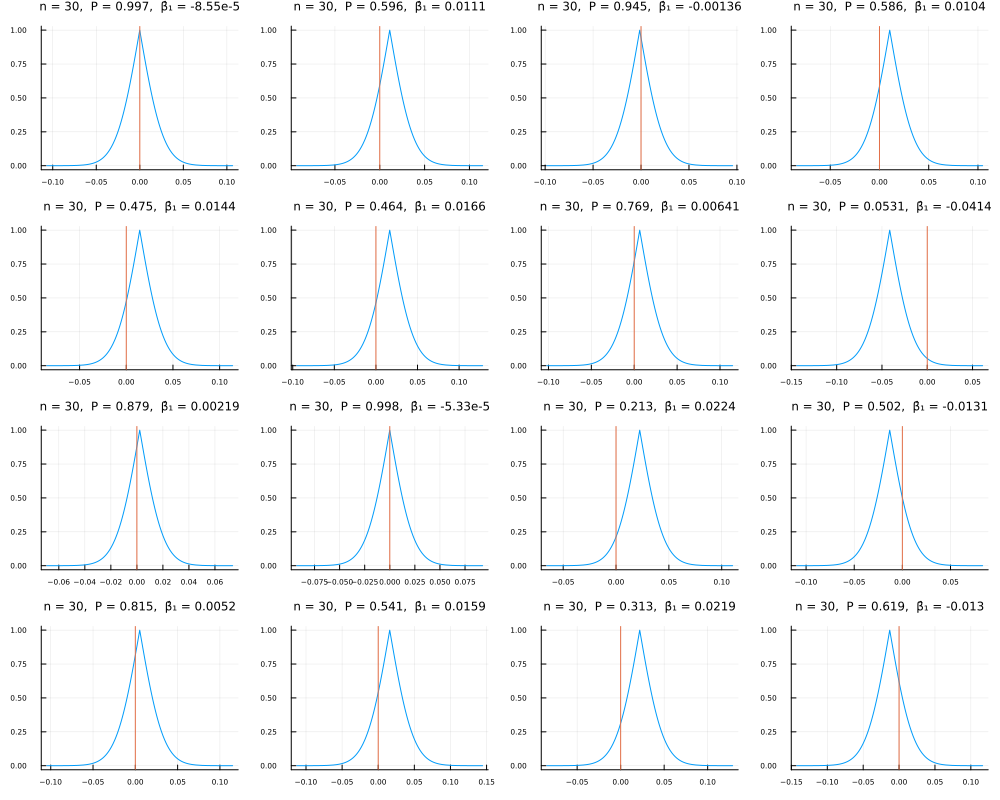

In [12]:
Random.seed!(4649373)
plot_pvalfun4x4(Normal(), 1:30)

se = √((inv(A' * A))[2, 2]) = 0.021093572976433474


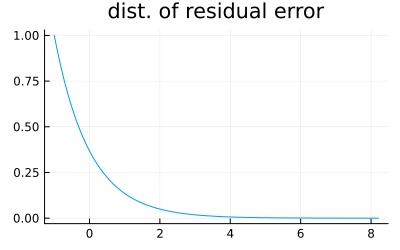

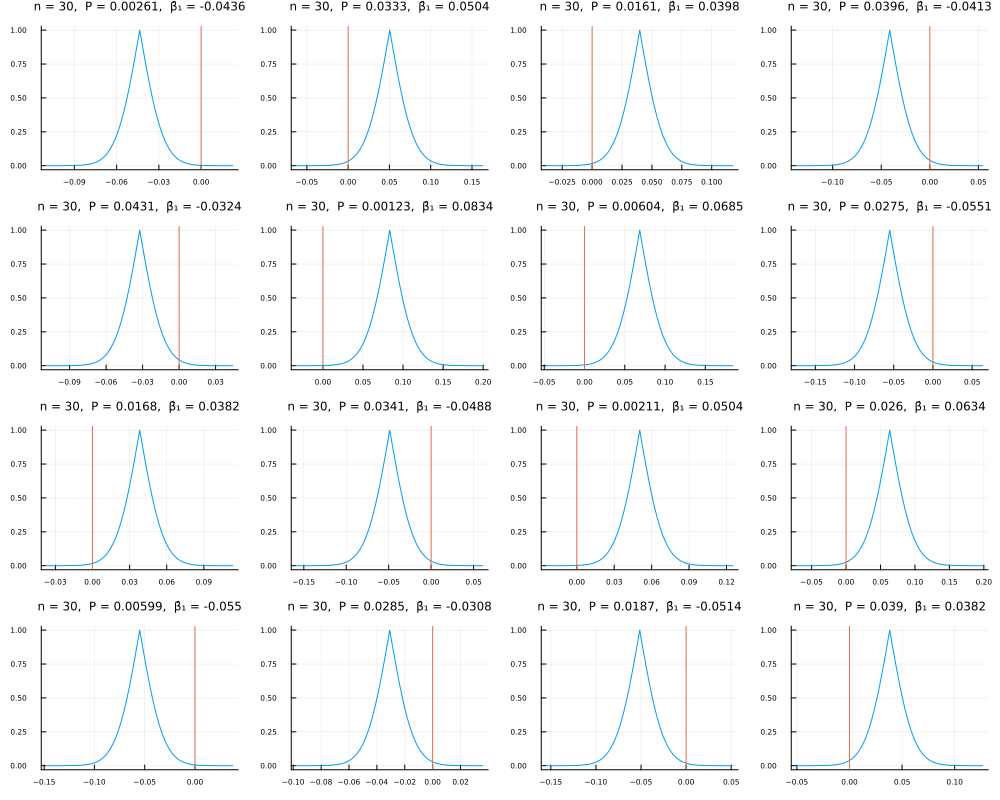

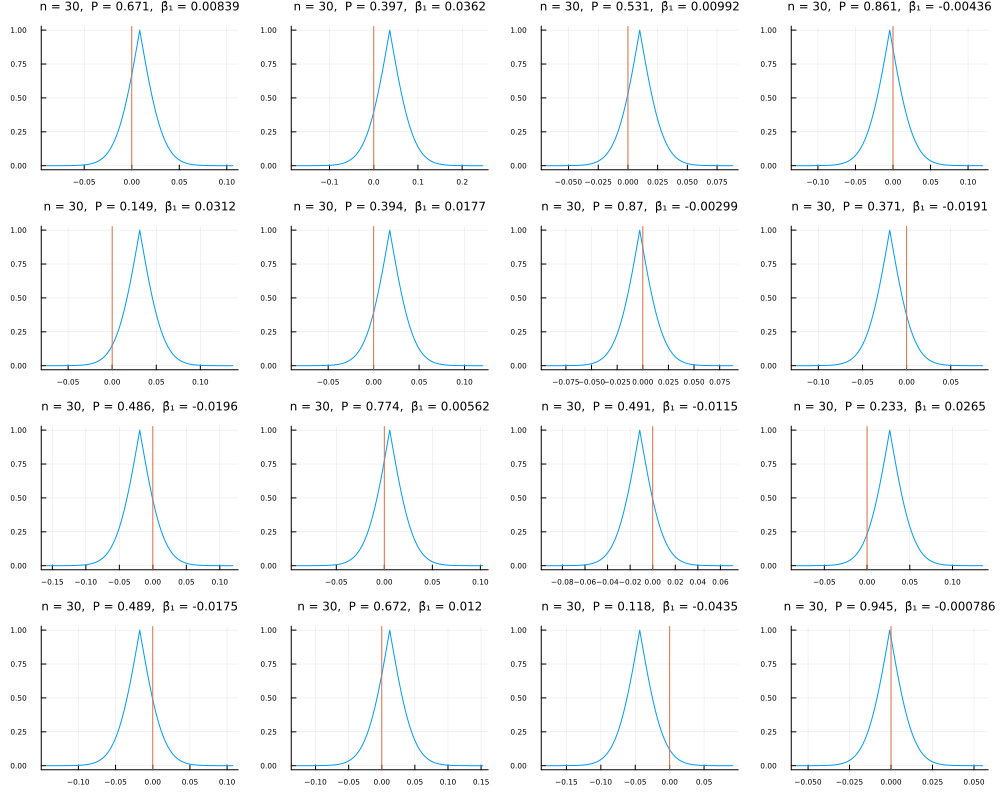

In [13]:
Random.seed!(4649373)
plot_pvalfun4x4(Exponential(), 1:30)

se = √((inv(A' * A))[2, 2]) = 0.021093572976433474


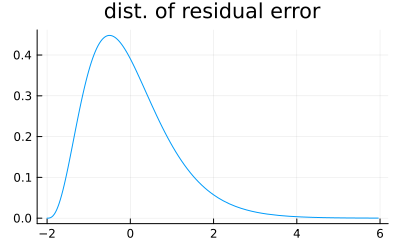

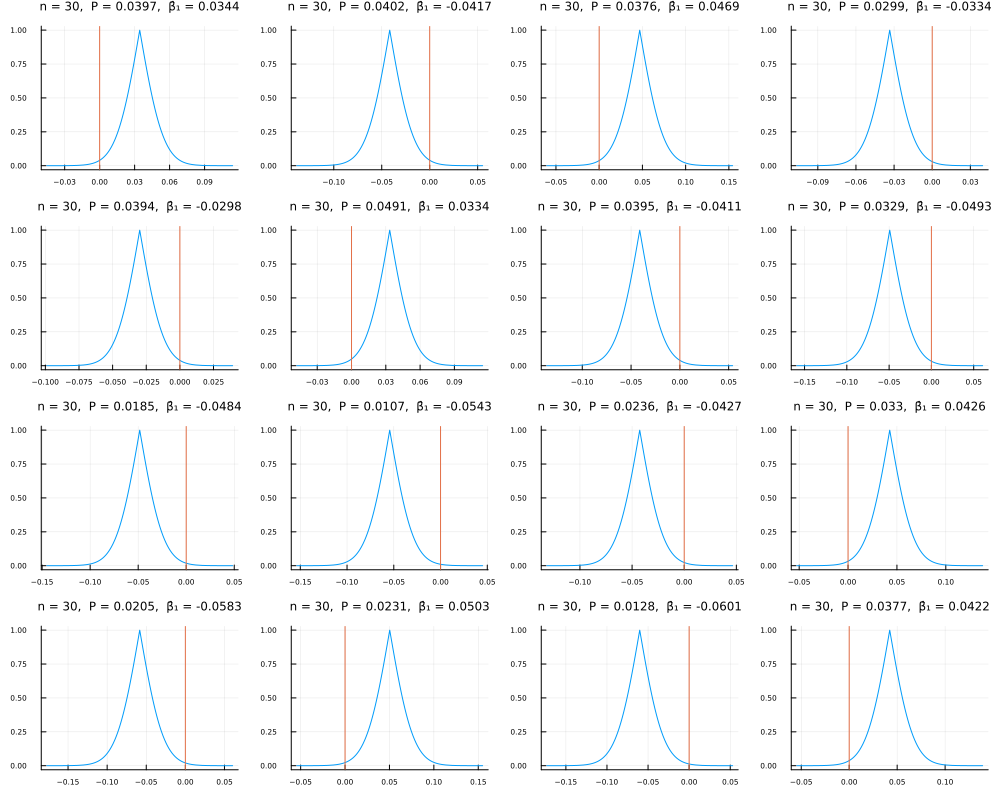

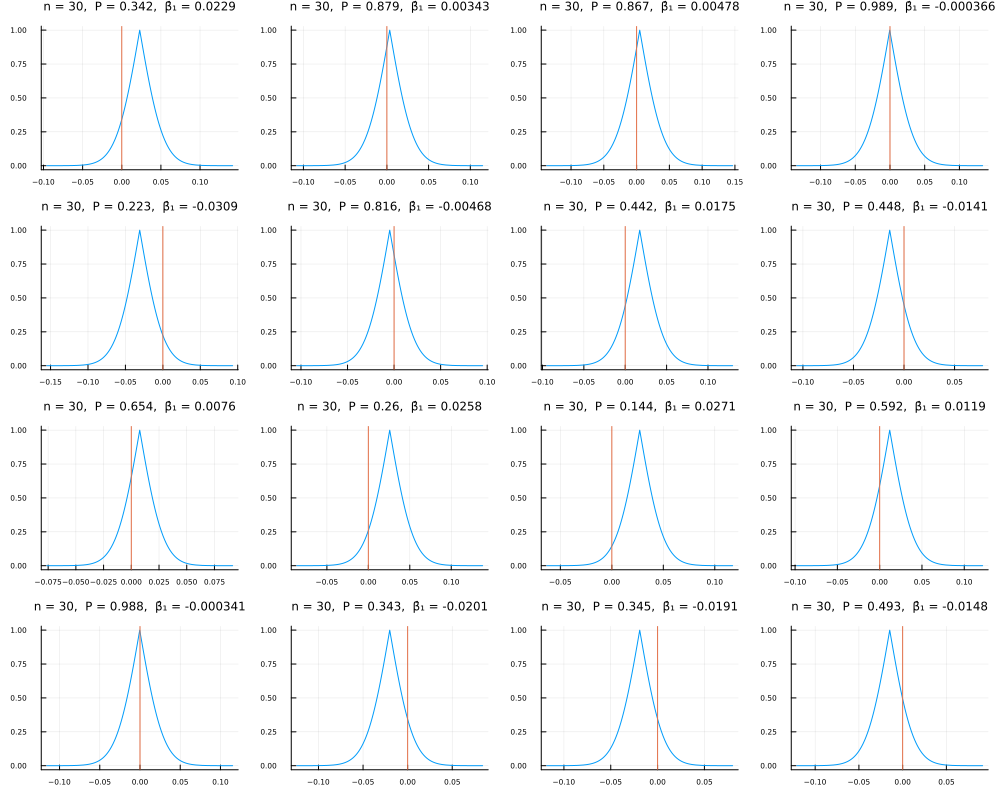

In [14]:
Random.seed!(4649373)
plot_pvalfun4x4(Gamma(4, 1/2), 1:30)

In [15]:
function plot_pvalfun_posterior(x, y)
    (; A, β̂, df, sehat, tval, pval, pvalfunc, posterior) = simplelinreg(x, y)
    β̂₁ = β̂[2]
    @show β̂₁
    a, b = β̂₁ - 5sehat, β̂₁ + 5sehat
    scatter(x, y; label="data")
    plot!(x -> evalpoly(x, β̂), extrema(x)...; label="")
    plot!(size=(400, 250)) |> display
    P = plot(pvalfunc, a, b; label="")
    title!("P-value function")
    plot!(xguide="β₁", yguide="P-value")
    Q = plot(posterior, a, b; label="", c=2)
    title!("posterior for flat prior of (β, log σ²)")
    plot!(xguide="β₁", yguide="probability density")
    plot(P, Q; size=(600, 600), layout=(2, 1))
end

plot_pvalfun_posterior (generic function with 1 method)

β̂₁ = -0.05084702227702828


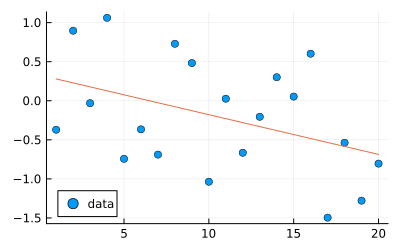

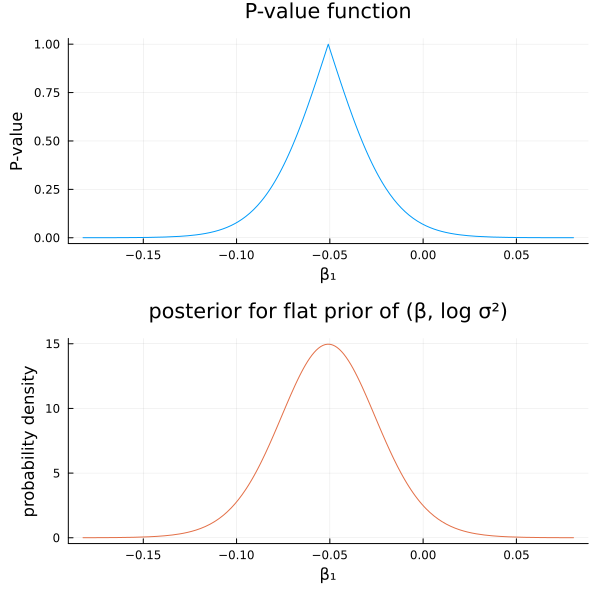

In [16]:
Random.seed!(4649373_18)
plot_pvalfun_posterior(1:20, randn(20))